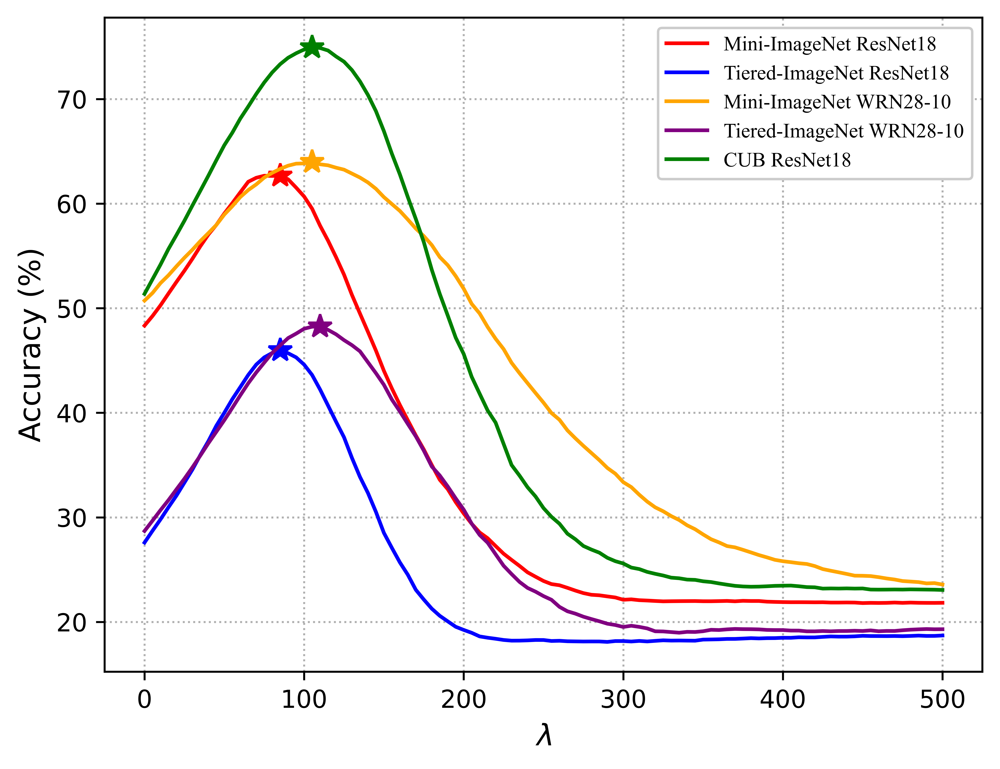

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

path_mini_res = 'plot/resnet18/mini_plot_5.csv'
path_tiered_res = 'plot/resnet18/tiered_plot_5.csv'
path_cub_res = 'plot/resnet18/cub_plot_5.csv'
path_mini_wideres = 'plot/wideres/mini_plot_5.csv'
path_tiered_wideres = 'plot/wideres/tiered_plot_5.csv'

mini_res = pd.read_csv(path_mini_res)
tiered_res = pd.read_csv(path_tiered_res)
cub_res = pd.read_csv(path_cub_res)
mini_wideres = pd.read_csv(path_mini_wideres)
tiered_wideres = pd.read_csv(path_tiered_wideres)

datasets = {
    "MiniImageNet-ResNet18": mini_res,
    "TieredImageNet-ResNet18": tiered_res,
    "CUB-ResNet18": cub_res,
    "MiniImageNet-WideResNet": mini_wideres,
    "TieredImageNet-WideResNet": tiered_wideres,
}

minires_max_id = mini_res['accuracy'].idxmax()
tieredres_max_id = tiered_res['accuracy'].idxmax()
cubres_max_id = cub_res['accuracy'].idxmax()
miniwideres_max_id = mini_wideres['accuracy'].idxmax()
tieredwideres_max_id = tiered_wideres['accuracy'].idxmax()

plt.figure(dpi=1200)
plt.plot(mini_res['alpha'], mini_res['accuracy']*100, label='Mini-ImageNet ResNet18', color='red')
plt.plot(mini_res['alpha'][minires_max_id], mini_res['accuracy'][minires_max_id]*100, marker='*', markersize=10, color='red')

plt.plot(tiered_res['alpha'], tiered_res['accuracy']*100, label='Tiered-ImageNet ResNet18', color='blue')
plt.plot(tiered_res['alpha'][tieredres_max_id], tiered_res['accuracy'][tieredres_max_id]*100, marker='*', markersize=10, color='blue')

plt.plot(mini_wideres['alpha'], mini_wideres['accuracy']*100, label='Mini-ImageNet WRN28-10', color='orange')
plt.plot(mini_wideres['alpha'][miniwideres_max_id], mini_wideres['accuracy'][miniwideres_max_id]*100, marker='*', markersize=10, color='orange')

plt.plot(tiered_wideres['alpha'], tiered_wideres['accuracy']*100, label='Tiered-ImageNet WRN28-10', color='purple')
plt.plot(tiered_wideres['alpha'][tieredwideres_max_id], tiered_wideres['accuracy'][tieredwideres_max_id]*100, marker='*', markersize=10, color='purple')

plt.plot(cub_res['alpha'], cub_res['accuracy']*100, label='CUB ResNet18', color='green')
plt.plot(cub_res['alpha'][cubres_max_id], cub_res['accuracy'][cubres_max_id]*100, marker='*', markersize=10, color='green')

plt.rcParams['font.family'] = 'Times New Roman'
plt.legend(fontsize='small', loc='upper right', framealpha=1, facecolor='white')
plt.xlabel(r"$\lambda$", fontsize='large')
plt.ylabel("Accuracy (%)", fontsize='large')
#plt.yticks([0, 25, 50, 75, 100])
plt.grid(linestyle=':')

plt.savefig('plot/plot_PADDLE2.png')

In [25]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
#img_left = mpimg.imread('plot/plot_PADDLE.png')
img_left = mpimg.imread('plot/plot_PADDLE2.png')
img_right = mpimg.imread('plot/plot_EM.png')

# Set up subplots with one row and two columns
fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(12, 6), dpi=1200)

# Display each image on its respective axis
ax_left.imshow(img_left)
ax_left.axis('off')  # Turn off axis for a cleaner look

ax_right.imshow(img_right)
ax_right.axis('off')

plt.tight_layout()
plt.show()
plt.savefig('plot/CVPR_ACCvsLAMBDA.png')

<Figure size 640x480 with 0 Axes>

In [16]:
import numpy as np
def softplus(x):
    return np.log(1 + np.exp(x))

def reverse_softplus(x):
    return np.log(np.exp(x) - 1)

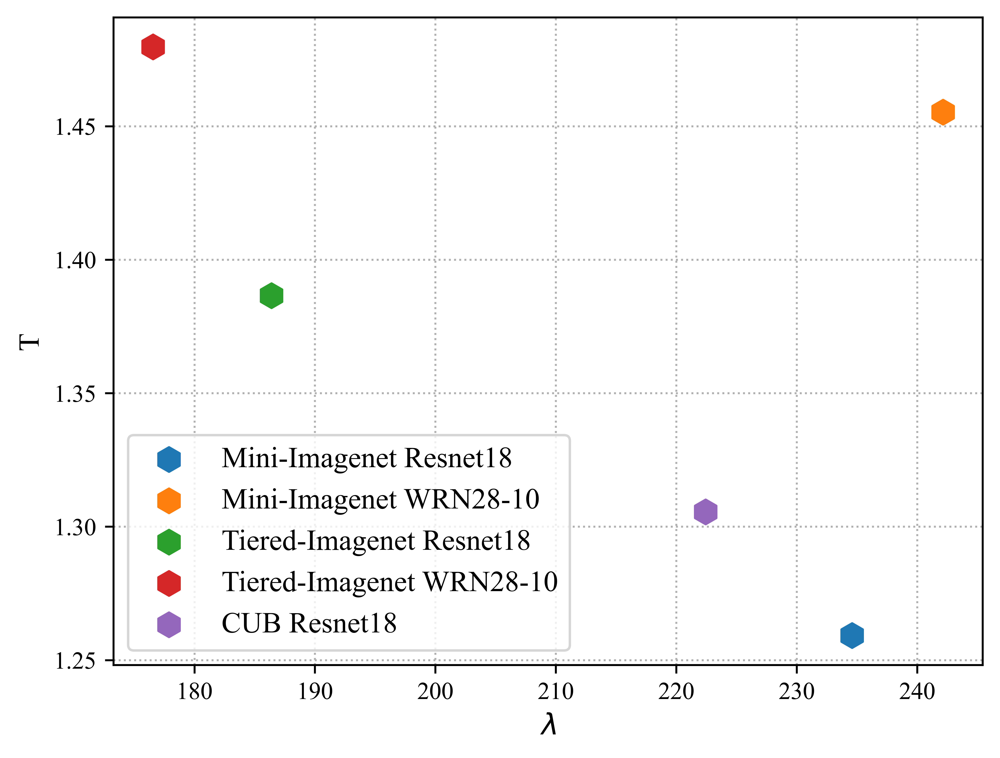

In [69]:
from adjustText import adjust_text
texts = []

plt.figure(dpi=1200)
plt.rcParams['font.family'] = 'Times New Roman'
learned_params_df = pd.read_csv('plot/learned_params_PADDLE.csv')
for index, row in learned_params_df.iterrows():
    plt.scatter(row['lambda']*75, softplus(row['t2'])+1, marker='h', s=100, label=row['dataset'])
#     text= plt.text(row['lambda']*75+0.5, softplus(row['t2'])+1.005, f"{row['dataset']}", fontsize=9)
#     texts.append(text)
# adjust_text(texts)

plt.xlabel(r"$\lambda$", fontsize='large')
plt.ylabel("T", fontsize='large')
plt.grid(linestyle=':')
plt.legend(fontsize='large', loc='lower left')
plt.savefig('plot/plot_params_PADDLE.png')

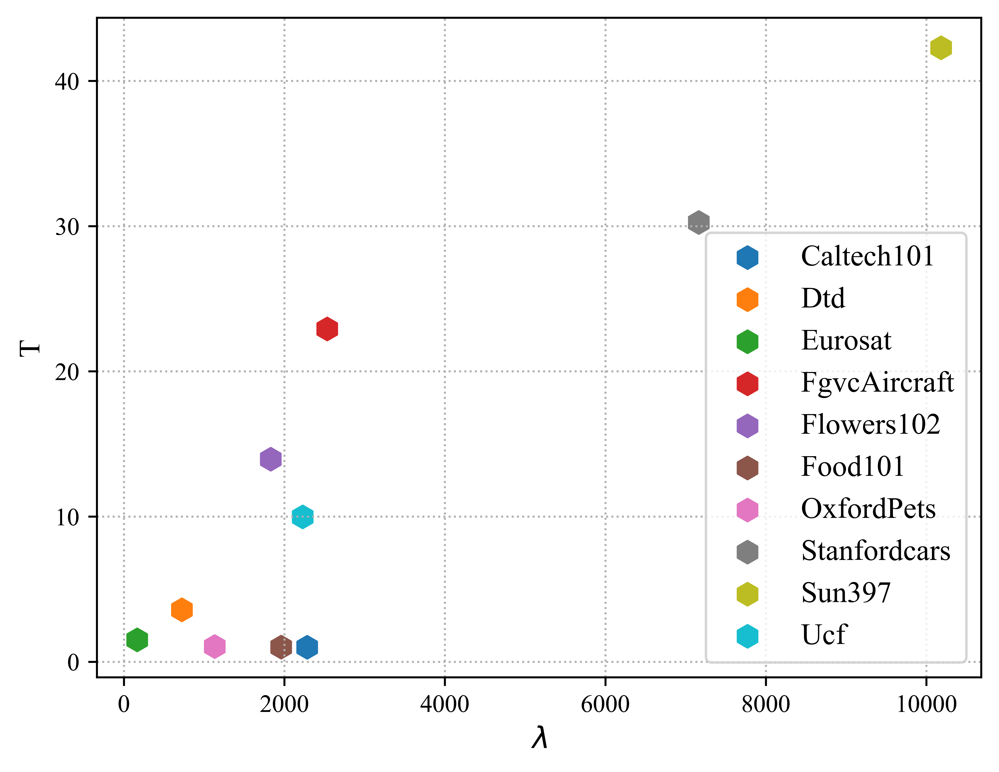

In [70]:
from adjustText import adjust_text
texts = []

plt.figure(dpi=1200)
plt.rcParams['font.family'] = 'Times New Roman'
learned_params_df = pd.read_csv('plot/learned_params_EM.csv')
for index, row in learned_params_df.iterrows():
    plt.scatter(row['lambda']*75, softplus(row['t2'])+1, marker='h', s=80, label=row['dataset'])
#     text= plt.text(row['lambda']*75+0.5, softplus(row['t2'])+1.005, f"{row['dataset']}", fontsize=9)
#     texts.append(text)
# adjust_text(texts)

plt.xlabel(r"$\lambda$", fontsize='large')
plt.ylabel("T", fontsize='large')
plt.grid(linestyle=':')
plt.legend(fontsize='large', loc='lower right')
plt.savefig('plot/plot_params_EM.png')

In [22]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img_left = mpimg.imread('plot/plot_params_PADDLE.png')
img_right = mpimg.imread('plot/plot_params_EM.png')

# Set up subplots with one row and two columns
fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(12, 6), dpi=1200)

# Display each image on its respective axis
ax_left.imshow(img_left)
ax_left.axis('off')  # Turn off axis for a cleaner look


ax_right.imshow(img_right)
ax_right.axis('off')


plt.tight_layout()
plt.show()

PARAMS ACROSS LAYERS

In [61]:
import torch
import torch.nn as nn

datasets = ['mini', 'tiered', 'cub']
y_labels = []
x_labels = []
for dataset in datasets:
    p = torch.load(f'results/u_params/{dataset}/resnet18/10/U_PADDLE_EMBT_L_5shots.pt')
    x_labels_temp = []
    y_labels_temp = []
    for key in p.keys():
        x_labels_temp.append(key)
        if key.startswith('t1'):
            y_labels_temp.append(nn.Softplus()(p[key]).item())
        elif key.startswith('t2'):
            y_labels_temp.append(nn.Softplus()(p[key]).item()+1)
        elif key.startswith('gamma'):
            y_labels_temp.append(nn.Softplus()(p[key]).item())
        else:
            raise ValueError(f"Unknown key: {key}")
    x_labels.append(x_labels_temp)
    y_labels.append(y_labels_temp)


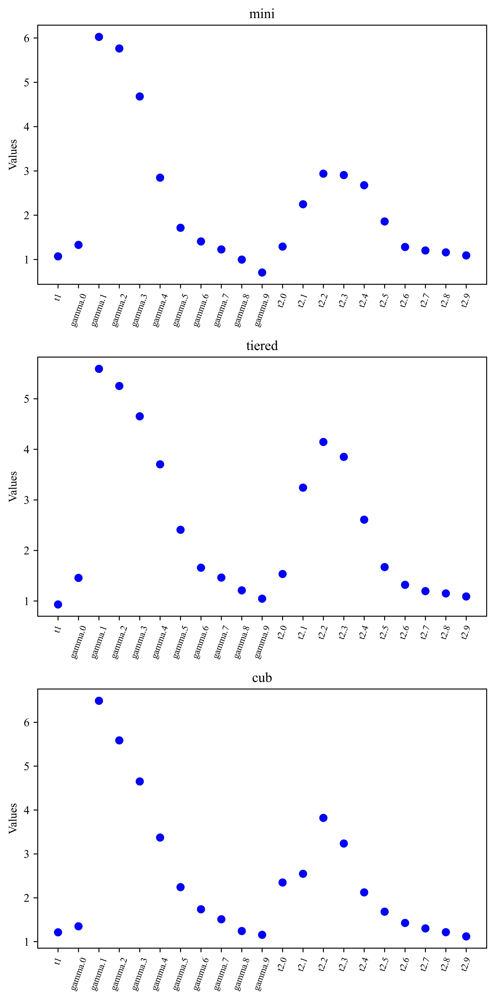

In [62]:
fig, ax = plt.subplots(3, 1, figsize=(6, 12), dpi=800)
for i in range(3):
    ax[i].scatter(x=x_labels[i], y=y_labels[i], color='blue', marker='o')  # Use range(len(y_labels)) for equally spaced points
    ax[i].set_xticks(range(len(x_labels[i])))
    ax[i].set_xticklabels(x_labels[i], fontsize=8, rotation=70)
    ax[i].set_ylabel("Values")
    ax[i].set_title(datasets[i])

plt.tight_layout()
# Display the plot
plt.show()
    

In [63]:
import torch
import torch.nn as nn

datasets = ['mini', 'tiered']
y_labels = []
x_labels = []
for dataset in datasets:
    p = torch.load(f'results/u_params/{dataset}/wideres/10/U_PADDLE_EMBT_L_5shots.pt')
    x_labels_temp = []
    y_labels_temp = []
    for key in p.keys():
        x_labels_temp.append(key)
        if key.startswith('t1'):
            y_labels_temp.append(nn.Softplus()(p[key]).item())
        elif key.startswith('t2'):
            y_labels_temp.append(nn.Softplus()(p[key]).item()+1)
        elif key.startswith('gamma'):
            y_labels_temp.append(nn.Softplus()(p[key]).item())
        else:
            raise ValueError(f"Unknown key: {key}")
    x_labels.append(x_labels_temp)
    y_labels.append(y_labels_temp)

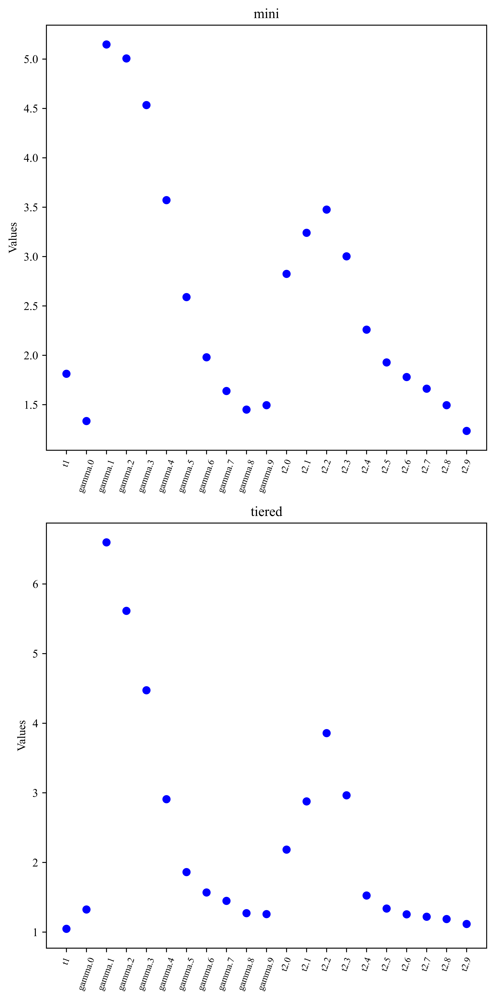

In [64]:
fig, ax = plt.subplots(2, 1, figsize=(6, 12), dpi=800)
for i in range(2):
    ax[i].scatter(x=x_labels[i], y=y_labels[i], color='blue', marker='o')  # Use range(len(y_labels)) for equally spaced points
    ax[i].set_xticks(range(len(x_labels[i])))
    ax[i].set_xticklabels(x_labels[i], fontsize=8, rotation=70)
    ax[i].set_ylabel("Values")
    ax[i].set_title(datasets[i])

plt.tight_layout()
# Display the plot
plt.show()
    

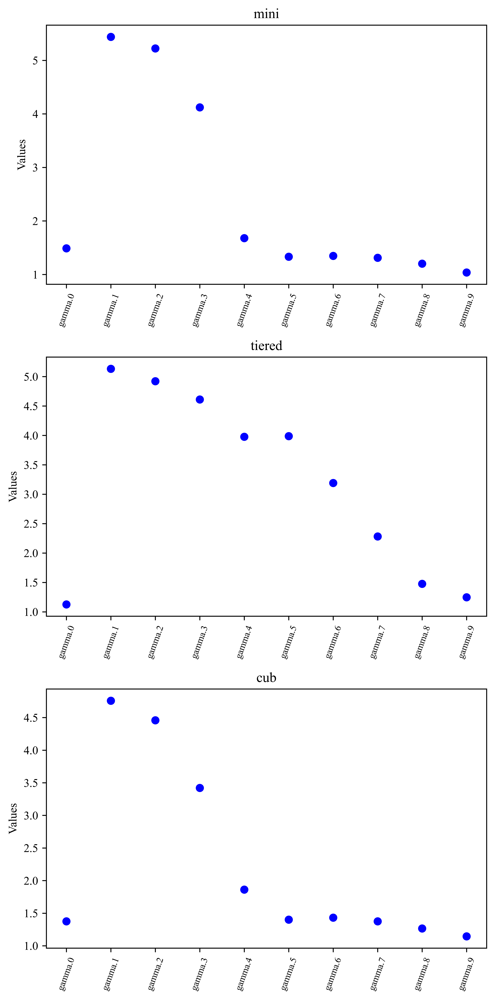

In [68]:
import torch
import torch.nn as nn

datasets = ['mini', 'tiered', 'cub']
y_labels = []
x_labels = []
for dataset in datasets:
    p = torch.load(f'results/u_params/{dataset}/resnet18/10/U_PADDLE_L_5shots.pt')
    #print(p)
    x_labels_temp = []
    y_labels_temp = []
    for key in p.keys():
        if key.startswith('t1'):
            y_labels_temp.append(nn.Softplus()(p[key]).item())
            x_labels_temp.append(key)
        elif key.startswith('t2'):
            y_labels_temp.append(nn.Softplus()(p[key]).item()+1)
            x_labels_temp.append(key)
        elif key.startswith('gamma'):
            y_labels_temp.append(nn.Softplus()(p[key]).item())
            x_labels_temp.append(key)
        else:
            continue
    x_labels.append(x_labels_temp)
    y_labels.append(y_labels_temp)

fig, ax = plt.subplots(3, 1, figsize=(6, 12), dpi=800)
for i in range(3):
    ax[i].scatter(x=x_labels[i], y=y_labels[i], color='blue', marker='o')  # Use range(len(y_labels)) for equally spaced points
    ax[i].set_xticks(range(len(x_labels[i])))
    ax[i].set_xticklabels(x_labels[i], fontsize=8, rotation=70)
    ax[i].set_ylabel("Values")
    ax[i].set_title(datasets[i])

plt.tight_layout()
# Display the plot
plt.show()
    

PLOT AVG ACROSS LAYERS

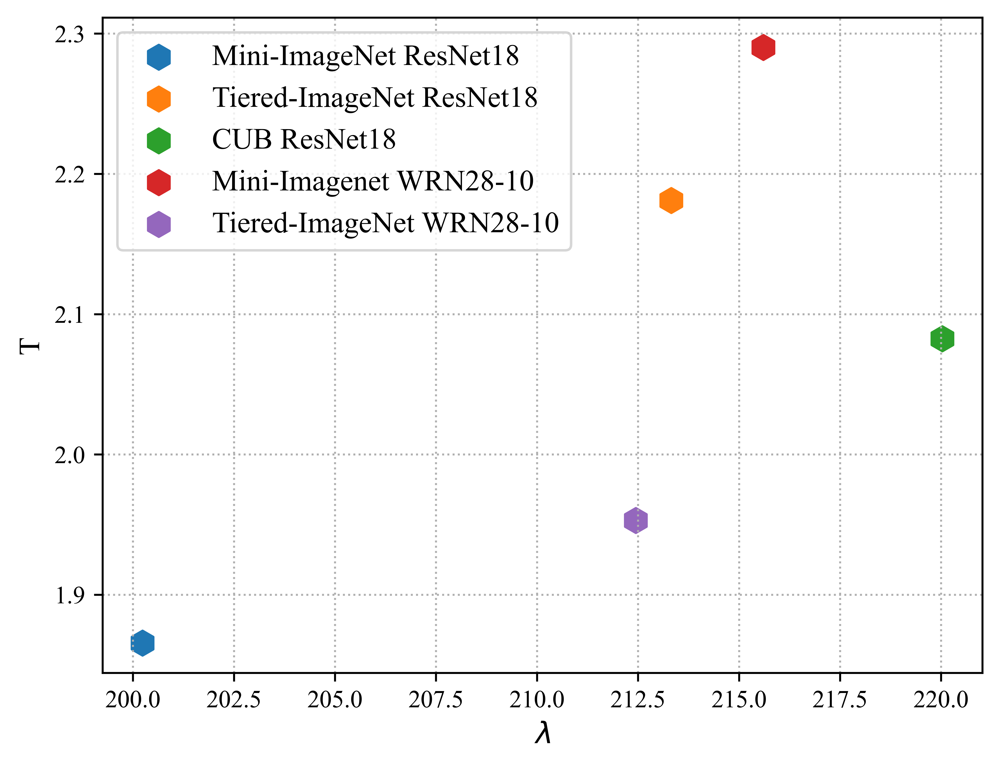

In [75]:
import torch
import torch.nn as nn

datasets = ['mini', 'tiered', 'cub']
t = []
gamma = []
label = []
labels = ['Mini-ImageNet ResNet18', 'Tiered-ImageNet ResNet18', 'CUB ResNet18', 'Mini-Imagenet WRN28-10', 'Tiered-ImageNet WRN28-10']
plt.figure(dpi=1200)
plt.rcParams['font.family'] = 'Times New Roman'
for dataset in datasets:
    p = torch.load(f'results/u_params/{dataset}/resnet18/10/U_PADDLE_EMBT_L_5shots.pt')
    t1_temp = []
    t2_temp = []
    gamma_temp = []
    for key in p.keys():
        if key.startswith('t1'):
            t1_temp.append(nn.Softplus()(p[key]).item())
        elif key.startswith('t2'):
            t2_temp.append(nn.Softplus()(p[key]).item()+1)
        elif key.startswith('gamma'):
            gamma_temp.append(nn.Softplus()(p[key]).item())
        else:
            raise ValueError(f"Unknown key: {key}")
    avg_t1 = sum(t1_temp)/len(t1_temp)
    avg_t2 = sum(t2_temp)/len(t2_temp)
    avg_gamma = sum(gamma_temp)/len(gamma_temp)
    t.append(avg_t2)
    gamma.append(avg_gamma)
    label.append(dataset+' ResNet18')
datasets.remove('cub')
for dataset in datasets:
    p = torch.load(f'results/u_params/{dataset}/wideres/10/U_PADDLE_EMBT_L_5shots.pt')
    t1_temp = []
    t2_temp = []
    gamma_temp = []
    for key in p.keys():
        if key.startswith('t1'):
            t1_temp.append(nn.Softplus()(p[key]).item())
        elif key.startswith('t2'):
            t2_temp.append(nn.Softplus()(p[key]).item()+1)
        elif key.startswith('gamma'):
            gamma_temp.append(nn.Softplus()(p[key]).item())
        else:
            raise ValueError(f"Unknown key: {key}")
    avg_t1 = sum(t1_temp)/len(t1_temp)
    avg_t2 = sum(t2_temp)/len(t2_temp)
    avg_gamma = sum(gamma_temp)/len(gamma_temp)
    t.append(avg_t2)
    gamma.append(avg_gamma)
    label.append(dataset+' WRN28-10')



for i, txt in enumerate(labels):
    plt.scatter(gamma[i]*75, t[i], marker='h', s=100, label=txt)
#     text= plt.text(row['lambda']*75+0.5, softplus(row['t2'])+1.005, f"{row['dataset']}", fontsize=9)
#     texts.append(text)
# adjust_text(texts)

plt.xlabel(r"$\lambda$", fontsize='large')
plt.ylabel("T", fontsize='large')
plt.grid(linestyle=':')
plt.legend(fontsize='large', loc='upper left')
plt.savefig('plot/plot_avg_params_PADDLE.png')

In [76]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the images
img_left = mpimg.imread('plot/plot_avg_params_PADDLE.png')
img_right = mpimg.imread('plot/plot_avg_params_EM.png')

# Set up subplots with one row and two columns
fig, (ax_left, ax_right) = plt.subplots(1, 2, figsize=(12, 6), dpi=1200)

# Display each image on its respective axis
ax_left.imshow(img_left)
ax_left.axis('off')  # Turn off axis for a cleaner look


ax_right.imshow(img_right)
ax_right.axis('off')


plt.tight_layout()
plt.show()